# Google Notebook specific Stuff

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!pip install pytorch-lightning==1.3.3
# !pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.8.1-cp37-cp37m-linux_x86_64.whl
!pip install scGeneFit
!pip install scanpy
!pip install anndata
# my version of smashpy that fixed imports, nothing else was changed
!pip install matplotlib>=3.3.2
!pip install shap>=0.37.0
!pip install xgboost>=1.3.3
!pip install imbalanced-learn>=0.7.0
!pip install numba>=0.51.2
!pip install harmonypy>=0.0.5
!git clone https://github.com/beelze-b/SmashFork.git
!git clone https://github.com/ahsv/RankCorr.git

     |████████████████████████████████| 808kB 14.8MB/s 
     |████████████████████████████████| 10.6MB 23.4MB/s 
     |████████████████████████████████| 235kB 44.2MB/s 
     |████████████████████████████████| 645kB 41.1MB/s 
     |████████████████████████████████| 829kB 42.3MB/s 
     |████████████████████████████████| 122kB 46.7MB/s 
     |████████████████████████████████| 1.3MB 45.6MB/s 
     |████████████████████████████████| 296kB 55.3MB/s 
     |████████████████████████████████| 143kB 60.9MB/s 
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491070 sha256=e98e761ae645f28d8718da659cdd2353048569b60674bc45de0eb4c158b9b370
  Stored in directory: /root/.cache/pip/wheels/8b/99/a0/81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
Successfully built future
ERROR: tensorflow 2.5.0 has requirement tensorboard~=2.5, but you'll have tensorboard 2.4.1 which is incompatible.
  Found existing installation: tensorboard 2.5.0
    Uninstalling tensorboard-2.5.0:
      Suc

In [3]:
# Check GPU

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sun Jul 18 03:35:24 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    23W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import sys
import os
# to import utils
sys.path.append(os.path.abspath('/content/gdrive/My Drive/Differentiable-Sparse-Subset-Selection/notebooks'))

# All the Imports

In [5]:
%%time 
import itertools 
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder


from RankCorr.picturedRocks import Rocks
import SmashFork.smashpy as smashpy


import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F

from utils import *


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part o

CPU times: user 19 s, sys: 1.07 s, total: 20.1 s
Wall time: 24.9 s


In [6]:
cuda = True if torch.cuda.is_available() else False

device = torch.device("cuda:0" if cuda else "cpu")
#device = 'cpu'
print("Device")
print(device)

Device
cuda:0


# These should be parameters later on 

In [7]:
z_size = 15
hidden_layer_size = 500

# really good results for vanilla VAE on synthetic data with EPOCHS set to 50, 
# but when running locally set to 10 for reasonable run times
batch_size = 64
batch_norm = True


global_t = 3.0

k_range = [10, 50, 100, 250]
k = 50
num_times = 5

gpus = 1
tpu_cores = None

In [8]:
import multiprocessing

num_cores = multiprocessing.cpu_count()

# Here goes all the stuff that we change from dataset to dataset

In [9]:
from os import path

In [10]:
dataset_dir = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/'
model_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/models/'
viz_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/visualizations/'

if not path.exists(model_save_path):
  os.mkdir(model_save_path)

if not path.exists(model_save_path + 'experiment_data_folds/'):
  os.mkdir(model_save_path + 'experiment_data_folds/')
  
if not path.exists(viz_save_path):
  os.mkdir(viz_save_path)

  

# Dataset Specific Processing

`

In [11]:
preprocess_like_smash = False
preprocess_like_cell_location=True

In [12]:
import anndata

In [13]:
def relabel_mouse_labels(label):
    if isinstance(label, str):
        return label.split('_')[0]
    else:
        return label

In [14]:
adata_snrna_raw = anndata.read_h5ad(dataset_dir + "mouse_brain_all_cells_20200625.h5ad")
del adata_snrna_raw.raw
adata_snrna_raw = adata_snrna_raw
adata_snrna_raw.X = adata_snrna_raw.X.toarray()
## Cell type annotations
labels = pd.read_csv(dataset_dir + 'snRNA_annotation_astro_subtypes_refined59_20200823.csv', index_col=0)
labels['annotation'] = labels['annotation_1'].apply(lambda x: relabel_mouse_labels(x))
labels = labels[['annotation']]
labels = labels.reindex(index=adata_snrna_raw.obs_names)
adata_snrna_raw.obs[labels.columns] = labels
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['annotation'].isna(), :]
adata_snrna_raw = adata_snrna_raw[adata_snrna_raw.obs["annotation"]!='Unk']
adata_snrna_raw.obs['annotation'] = adata_snrna_raw.obs['annotation'].astype('category')

Trying to set attribute `.obs` of view, copying.


In [15]:
adata_snrna_raw.X

array([[14.,  2.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [ 3.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 5.,  2.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [16]:
labels['annotation'].unique()

array(['Ext', 'Oligo', 'Astro', 'Inh', 'Micro', 'Nb', 'Unk', 'OPC',
       'LowQ', nan, 'Endo'], dtype=object)

In [17]:
adata_snrna_raw.layers

Layers with keys: 

In [18]:
print(adata_snrna_raw.shape)

(39583, 31053)


In [19]:
def remove_features_pct(adata, group_by=None, pct=0.3):
		if group_by is None:
			print("select a group_by in .obs")
			return
		if group_by not in adata.obs.columns:
			print("group_by must be in .obs")
			return 
		
		
		list_keep_genes = []
		
		df = pd.DataFrame(data=False, 
						  index=adata.var.index.tolist(),
						  columns=adata.obs[group_by].cat.categories)
		for g in adata.obs[group_by].cat.categories: 
			reduced = adata[adata.obs[group_by]==g]
			boolean, values = sc.pp.filter_genes(reduced, min_cells = reduced.n_obs*pct, inplace=False)
			df[g] = boolean
		dfT = df.T
		for g in dfT.columns:
			if True in dfT[g].tolist():
				list_keep_genes.append(True)
			else:
				list_keep_genes.append(False)
		
		adata.var["general"] = list_keep_genes
		
		adata = adata[:, adata.var["general"]]
		
		return adata

def remove_features_pct_2groups(adata, group_by=None, pct1=0.9, pct2=0.5):
    if group_by is None:
        print("select a group_by in .obs")
        return
    if group_by not in adata.obs.columns:
        print("group_by must be in .obs")
        return 
    
    
    list_keep_genes = []
    
    df = pd.DataFrame(data=False, 
                        index=adata.var.index.tolist(),
                        columns=adata.obs[group_by].cat.categories)
    for g in adata.obs[group_by].cat.categories: 
        reduced = adata[adata.obs[group_by]==g]
        boolean, values = sc.pp.filter_genes(reduced, min_cells = reduced.n_obs*(pct1), inplace=False)
        df[g] = boolean
    dfT = df.T
    for g in dfT.columns:
        if (sum(dfT[g].tolist())/len(dfT[g].tolist())) >= pct2:
            list_keep_genes.append(False)
        else:
            list_keep_genes.append(True)
    
    adata.var["general"] = list_keep_genes
    
    adata = adata[:, adata.var["general"]]
    
    
    return adata


In [20]:
import gc

In [21]:
%%time

# doing this cuz smash was a lot of data
#https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_estimating_signatures.html
if preprocess_like_cell_location:
    sc.pp.filter_cells(adata_snrna_raw, min_genes=1)
    print(adata_snrna_raw.shape)
    sc.pp.filter_genes(adata_snrna_raw, min_cells=1)
    print(adata_snrna_raw.shape)

    gc.collect()
    # calculate the mean of each gene across non-zero cells
    adata_snrna_raw.var['n_cells'] = (adata_snrna_raw.X > 0).sum(0)
    adata_snrna_raw.var['nonz_mean'] = adata_snrna_raw.X.sum(0) / adata_snrna_raw.var['n_cells']

    nonz_mean_cutoff = np.log10(1.12) # cut off for expression in non-zero cells
    cell_count_cutoff = np.log10(adata_snrna_raw.shape[0] * 0.0005) # cut off percentage for cells with higher expression
    cell_count_cutoff2 = np.log10(adata_snrna_raw.shape[0] * 0.03)# cut off percentage for cells with small expression


    adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
            | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
        & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)].shape

    # select genes based on mean expression in non-zero cells
    adata_snrna_raw = adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
            | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
        & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)
                & np.array(~adata_snrna_raw.var['SYMBOL'].isna())]
    gc.collect()
    adata_snrna_raw.raw = adata_snrna_raw
    adata_snrna_raw.X = adata_snrna_raw.raw.X.copy()
    del adata_snrna_raw.raw
    gc.collect()
    adata_snrna_raw = remove_features_pct(adata_snrna_raw, group_by="annotation", pct=0.3)
    gc.collect()
    adata_snrna_raw = remove_features_pct_2groups(adata_snrna_raw, group_by="annotation", pct1=0.75, pct2=0.5)
    print(adata_snrna_raw.shape)
    
    sc.pp.normalize_per_cell(adata_snrna_raw, counts_per_cell_after=1e4)
    sc.pp.log1p(adata_snrna_raw)
    sc.pp.scale(adata_snrna_raw, max_value=10)


(39583, 31053)
(39583, 26493)


Trying to set attribute `.var` of view, copying.


(39583, 4581)


Trying to set attribute `.obs` of view, copying.


CPU times: user 1min 3s, sys: 933 ms, total: 1min 4s
Wall time: 1min 4s


In [22]:
adata_snrna_raw.shape

(39583, 4581)

In [23]:
X = adata_snrna_raw.X.copy()
labels = adata_snrna_raw.obs['annotation'].values
encoder = LabelEncoder()
encoder.fit(labels)
y = encoder.transform(labels)

In [24]:
input_size = X.shape[1]

In [25]:
X.shape

(39583, 4581)

# Set Up Models

## Train Smash Random Forest





In [ ]:
# needed for random forest Smash
!mkdir Figures

mkdir: cannot create directory ‘Figures’: File exists


 * Initialising ...

Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

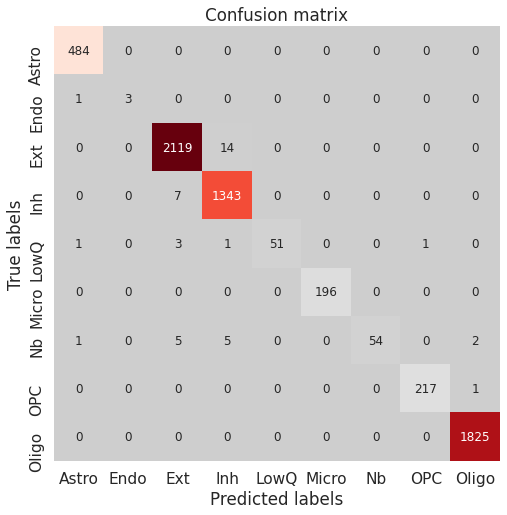

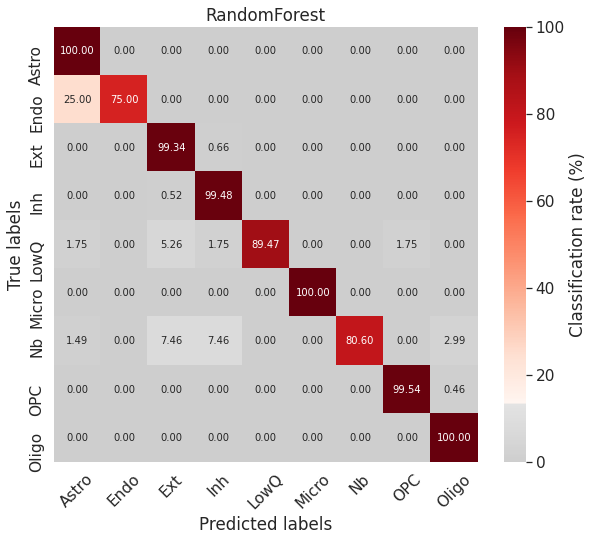

Accuracy: 0.9933691190401011: Misclassification: 0.006630880959898944
              precision    recall  f1-score   support

       Astro       0.99      1.00      1.00       484
        Endo       1.00      0.75      0.86         4
         Ext       0.99      0.99      0.99      2133
         Inh       0.99      0.99      0.99      1350
        LowQ       1.00      0.89      0.94        57
       Micro       1.00      1.00      1.00       196
          Nb       1.00      0.81      0.89        67
         OPC       1.00      1.00      1.00       218
       Oligo       1.00      1.00      1.00      1825

    accuracy                           0.99      6334
   macro avg       1.00      0.94      0.96      6334
weighted avg       0.99      0.99      0.99      6334



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



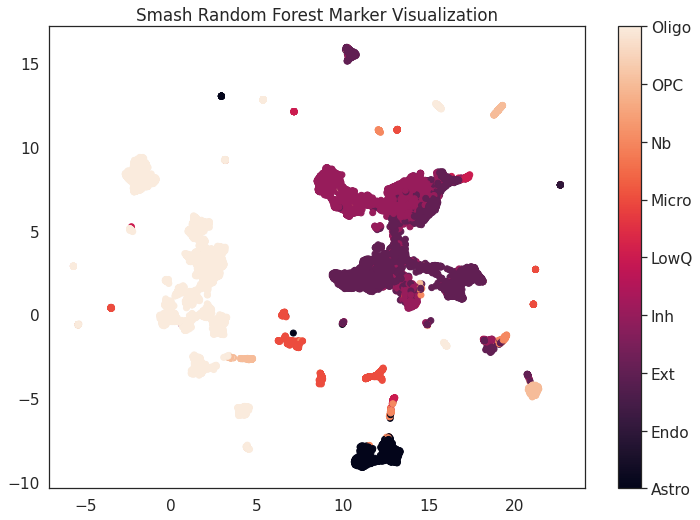

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

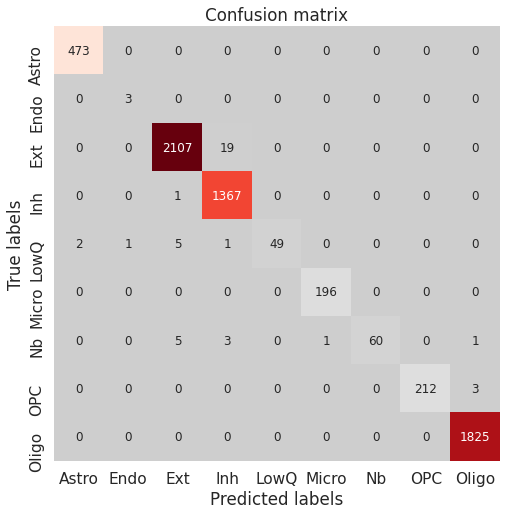

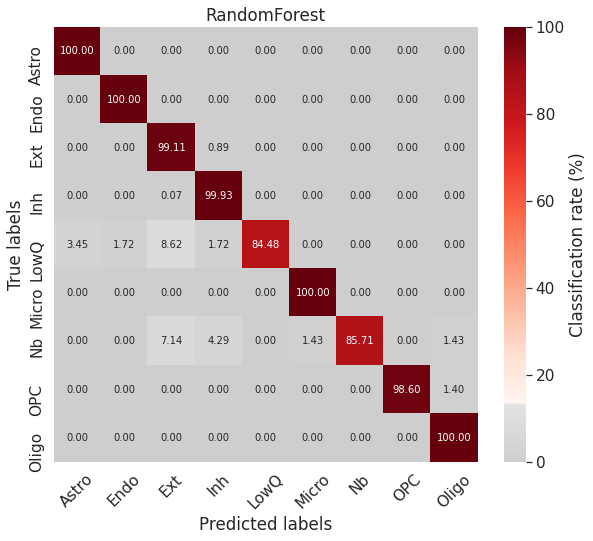

Accuracy: 0.9933691190401011: Misclassification: 0.006630880959898944
              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.75      1.00      0.86         3
         Ext       0.99      0.99      0.99      2126
         Inh       0.98      1.00      0.99      1368
        LowQ       1.00      0.84      0.92        58
       Micro       0.99      1.00      1.00       196
          Nb       1.00      0.86      0.92        70
         OPC       1.00      0.99      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           0.99      6334
   macro avg       0.97      0.96      0.96      6334
weighted avg       0.99      0.99      0.99      6334



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



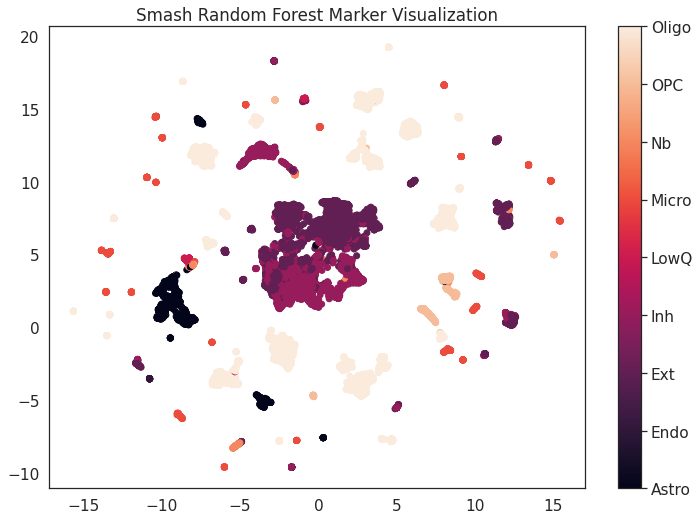

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

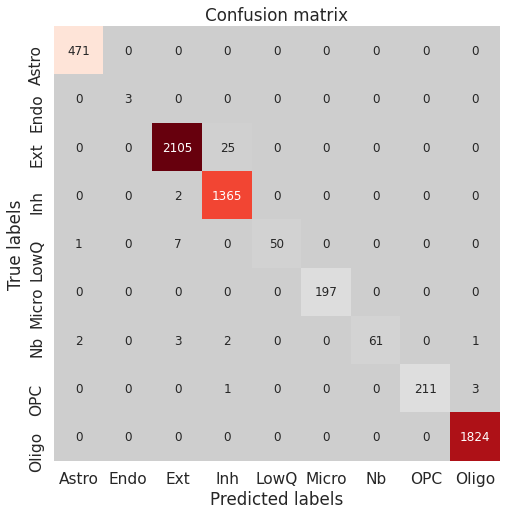

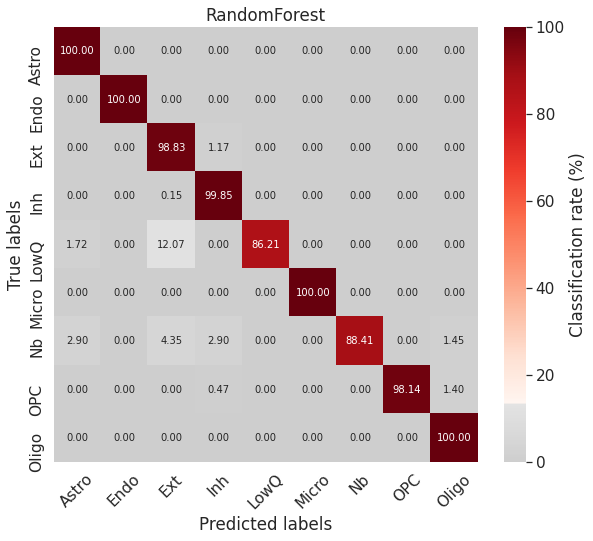

Accuracy: 0.9925797284496369: Misclassification: 0.007420271550363067
              precision    recall  f1-score   support

       Astro       0.99      1.00      1.00       471
        Endo       1.00      1.00      1.00         3
         Ext       0.99      0.99      0.99      2130
         Inh       0.98      1.00      0.99      1367
        LowQ       1.00      0.86      0.93        58
       Micro       1.00      1.00      1.00       197
          Nb       1.00      0.88      0.94        69
         OPC       1.00      0.98      0.99       215
       Oligo       1.00      1.00      1.00      1824

    accuracy                           0.99      6334
   macro avg       1.00      0.97      0.98      6334
weighted avg       0.99      0.99      0.99      6334



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



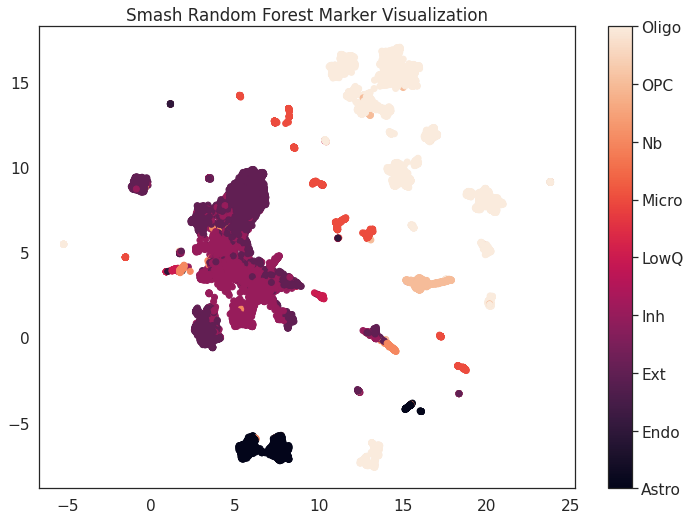

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

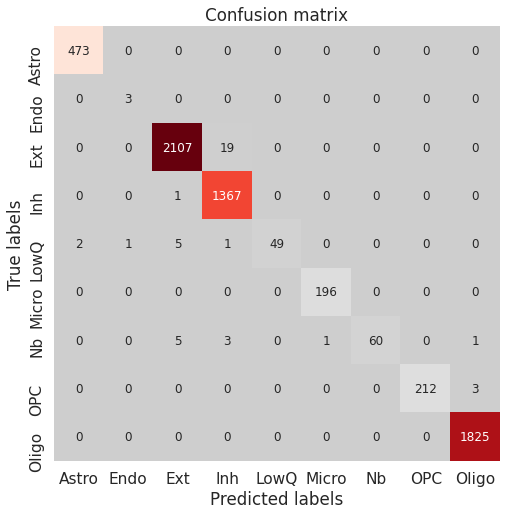

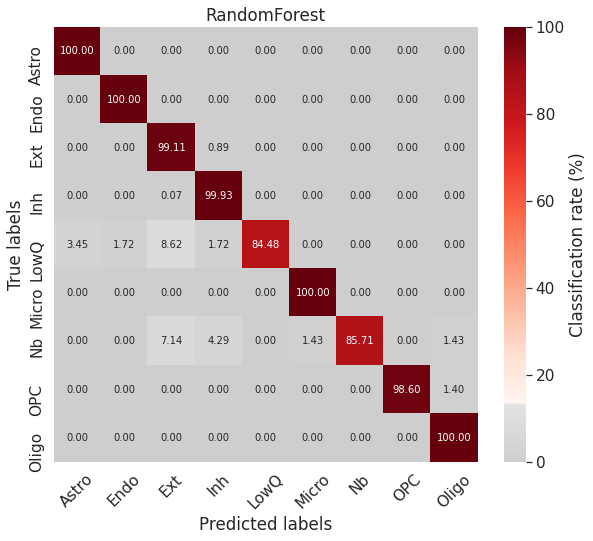

Accuracy: 0.9933691190401011: Misclassification: 0.006630880959898944
              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.75      1.00      0.86         3
         Ext       0.99      0.99      0.99      2126
         Inh       0.98      1.00      0.99      1368
        LowQ       1.00      0.84      0.92        58
       Micro       0.99      1.00      1.00       196
          Nb       1.00      0.86      0.92        70
         OPC       1.00      0.99      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           0.99      6334
   macro avg       0.97      0.96      0.96      6334
weighted avg       0.99      0.99      0.99      6334



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



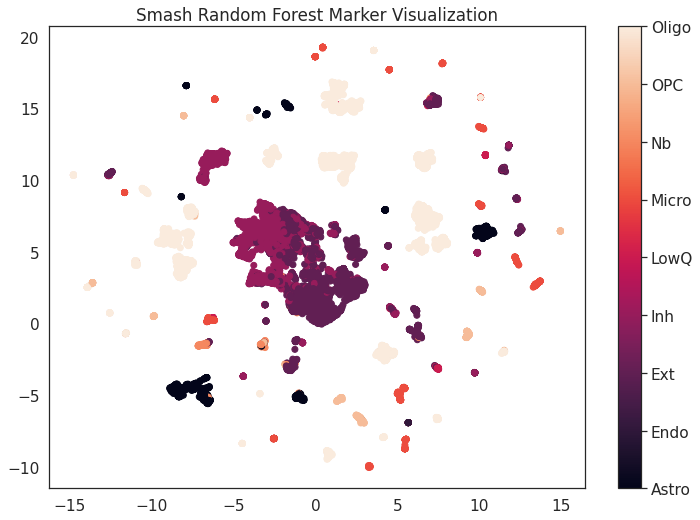

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

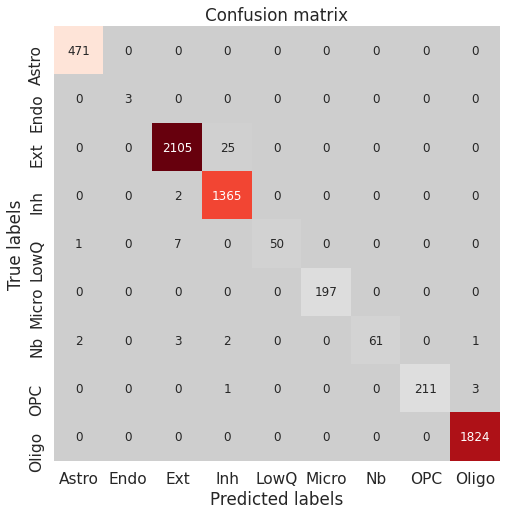

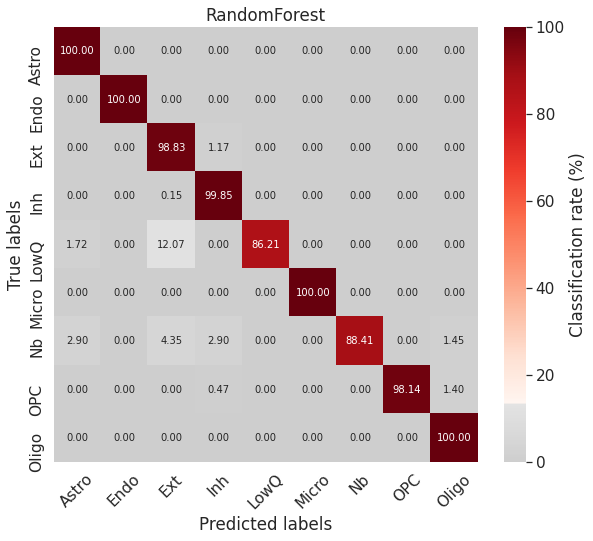

Accuracy: 0.9925797284496369: Misclassification: 0.007420271550363067
              precision    recall  f1-score   support

       Astro       0.99      1.00      1.00       471
        Endo       1.00      1.00      1.00         3
         Ext       0.99      0.99      0.99      2130
         Inh       0.98      1.00      0.99      1367
        LowQ       1.00      0.86      0.93        58
       Micro       1.00      1.00      1.00       197
          Nb       1.00      0.88      0.94        69
         OPC       1.00      0.98      0.99       215
       Oligo       1.00      1.00      1.00      1824

    accuracy                           0.99      6334
   macro avg       1.00      0.97      0.98      6334
weighted avg       0.99      0.99      0.99      6334



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



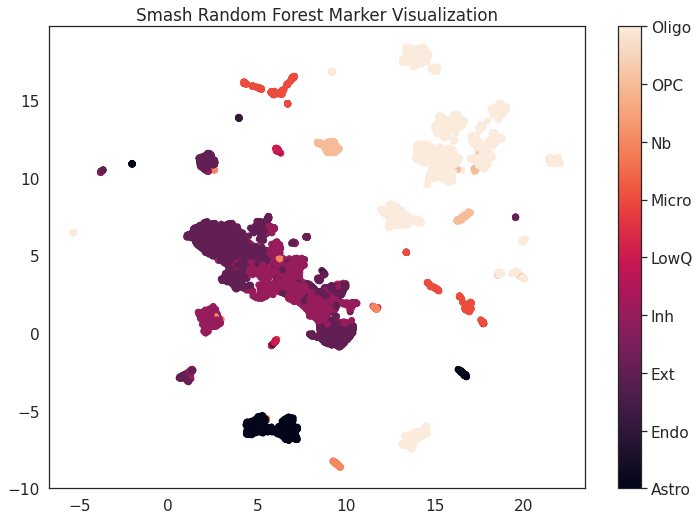

In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = adata_snrna_raw[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    clf = sm.ensemble_learning(train_X_y, group_by="annotation", classifier="RandomForest", balance=True, verbose=True)
    selectedGenes, selectedGenes_dict = sm.gini_importance(train_X_y, clf, group_by="annotation", verbose=True, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = adata_snrna_raw.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_rf_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_rf_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_rf_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Random Forest Marker Visualization', path = viz_save_path + 'smash_rf_markers_{}.png'.format(tryy), markers = smash_markers)

## Train Smash DNN

the data is treated a bit differently than our other models

 * Initialising ...

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                146624    
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
activation (Activation)      (None, 32)                0         
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_1 (Batch (None, 16)                64        
_________________________________________________________________
activation_1 (Activation)    (None,

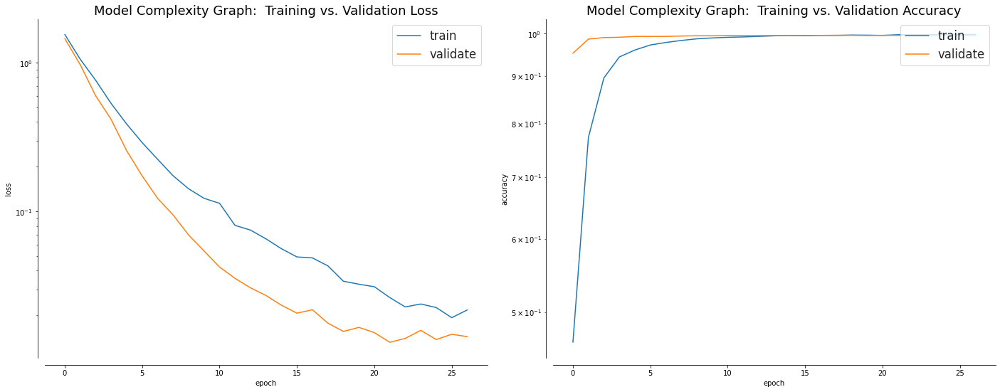

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

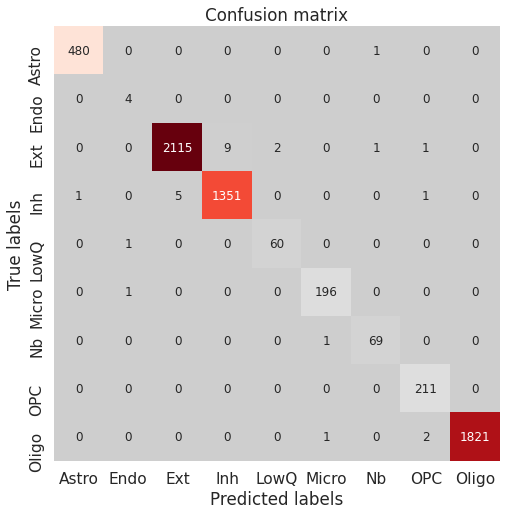

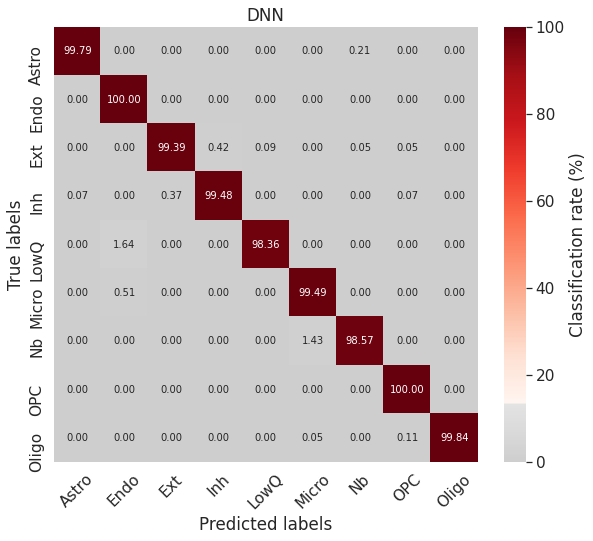

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       481
        Endo       0.67      1.00      0.80         4
         Ext       1.00      0.99      1.00      2128
         Inh       0.99      0.99      0.99      1358
        LowQ       0.97      0.98      0.98        61
       Micro       0.99      0.99      0.99       197
          Nb       0.97      0.99      0.98        70
         OPC       0.98      1.00      0.99       211
       Oligo       1.00      1.00      1.00      1824

    accuracy                           1.00      6334
   macro avg       0.95      0.99      0.97      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 4ms/step - loss: 0.0132 - accuracy: 0.9956 - auc: 1.0000 - precision: 0.9957 - recall: 0.9953


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:91: UserWarning:

keras is no longer supported, please use tf.keras instead.

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



KeyboardInterrupt: ignored

In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = adata_snrna_raw[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    sm.DNN(train_X_y, group_by="annotation", model=None, balance=True, verbose=True, save=False)
    selectedGenes, selectedGenes_dict = sm.run_shap(train_X_y, group_by="annotation", model=None, verbose=True, pct=0.1, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = adata_snrna_raw.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Marker Visualization', path = viz_save_path + 'smash_markers_{}.png'.format(tryy), markers = smash_markers)

Names are different than in the example notebook but things like
ENSMUSG00000062209 correspond to Erbb4.

In [ ]:
results

## Train RankCorr

In [ ]:
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    data = Rocks(X_train, y_train)
    lamb =3.25# this can be whatever

    rankcorr_markers = data.CSrankMarkers(lamb=lamb, writeOut=False, keepZeros=False, onlyNonZero=False)
    if len(rankcorr_markers) > k:
        rankcorr_markers = rankcorr_markers[:k]
    geneNames = np.array(adata_snrna_raw.var.index)
    data.genes = geneNames
    marker_genes = data.markers_to_genes(rankcorr_markers)
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = rankcorr_markers)
    np.save(model_save_path + 'rankcorr_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'rankcorr_markers_{}.npy'.format(tryy), rankcorr_markers)
    np.save(model_save_path + 'experiment_data_folds/rankcorr_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'RankCorr Marker Visualization', path = viz_save_path + 'rankcorr_markers_{}.png'.format(tryy), markers = rankcorr_markers)

In [ ]:
results

## Train L1 VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 1.2088e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



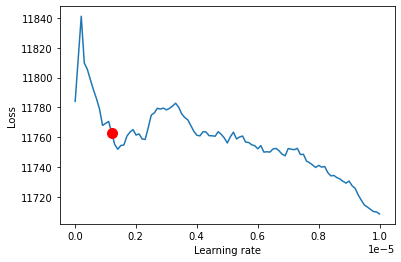

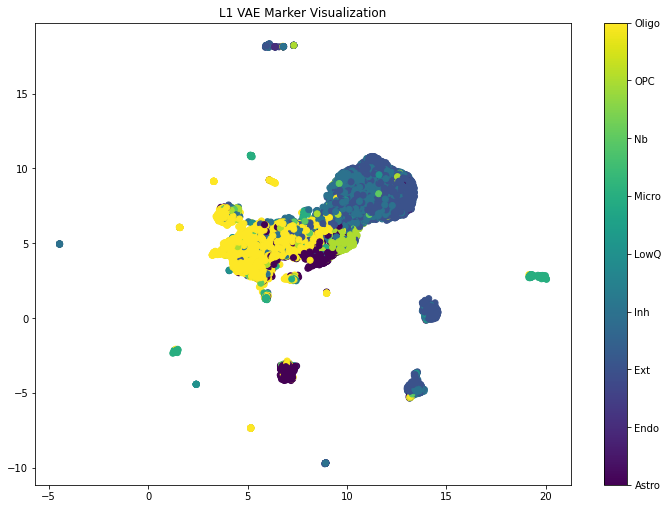

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 1.8082e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



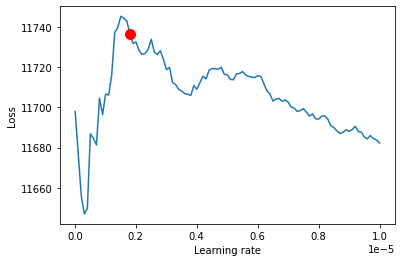

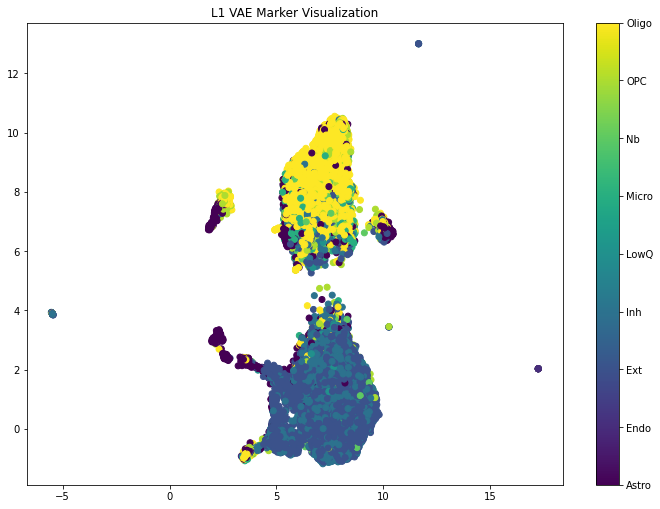

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 2.008e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



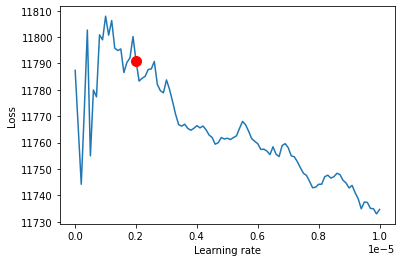

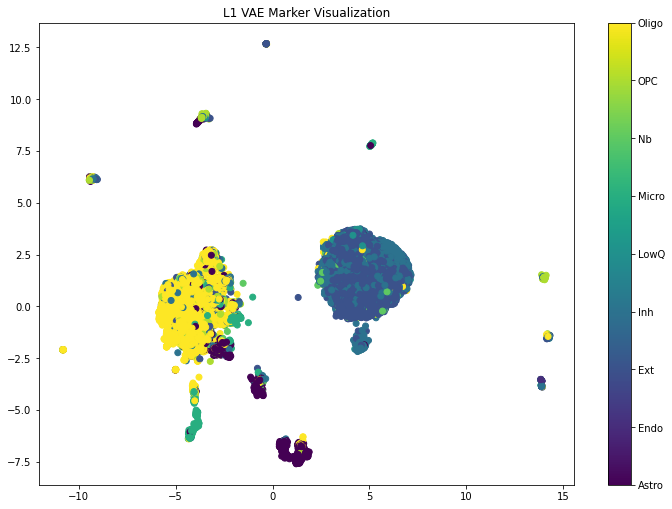

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 7.902100000000002e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



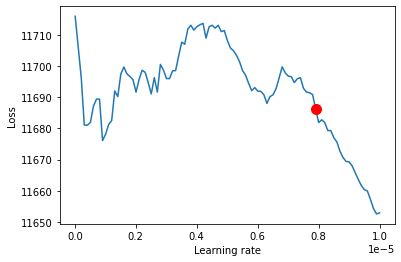

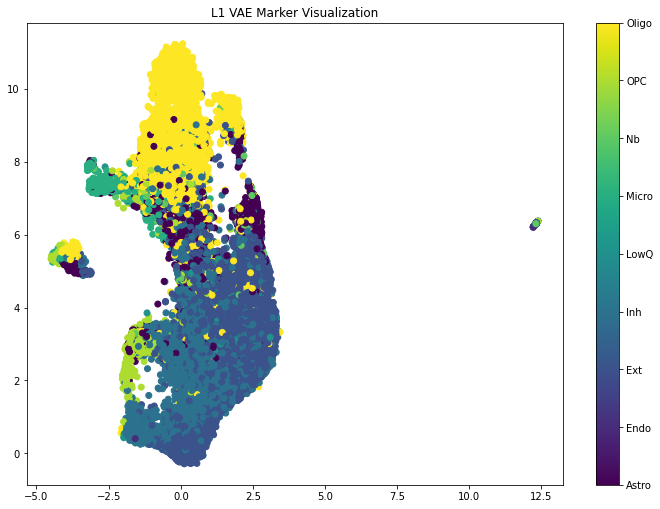

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 1.6084000000000001e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



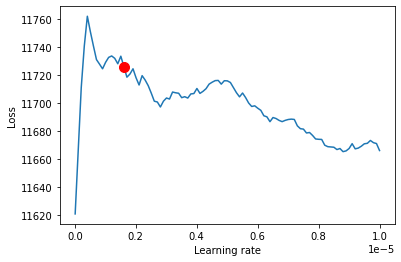

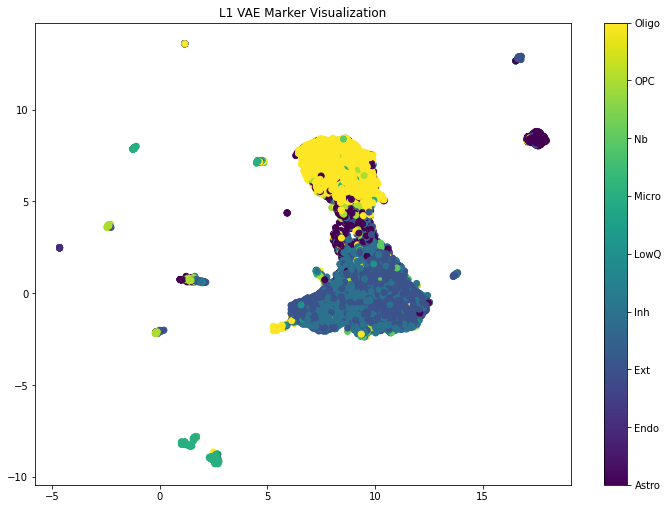

In [ ]:
feature_std = torch.tensor(X).std(dim = 0)
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_l1_diag(input_size, hidden_layer_size, z_size, batch_norm = batch_norm)
    tmp_path = model_save_path + 'l1_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.00001, early_stopping_patience = 10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    l1_markers = model.markers(feature_std = feature_std.to(model.device), k = k).clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = l1_markers)
    np.save(model_save_path + 'l1_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'l1_vae_markers_{}.npy'.format(tryy), l1_markers)
    np.save(model_save_path + 'experiment_data_folds/l1_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'L1 VAE Marker Visualization', path = viz_save_path + 'l1_vae_markers_{}.png'.format(tryy), markers = l1_markers)

In [ ]:
results

(0.13805734495389665,
 {'0': {'f1-score': 0.8432343234323433,
   'precision': 0.7996870109546166,
   'recall': 0.8917975567190227,
   'support': 573},
  '1': {'f1-score': 0.33333333333333337,
   'precision': 1.0,
   'recall': 0.2,
   'support': 5},
  '2': {'f1-score': 0.8568879371877229,
   'precision': 0.8265060240963855,
   'recall': 0.8895887365690996,
   'support': 2699},
  '3': {'f1-score': 0.7528494301139772,
   'precision': 0.7638466220328667,
   'recall': 0.7421643997634536,
   'support': 1691},
  '4': {'f1-score': 0.04597701149425288,
   'precision': 1.0,
   'recall': 0.023529411764705882,
   'support': 85},
  '5': {'f1-score': 0.9529914529914529,
   'precision': 0.9529914529914529,
   'recall': 0.9529914529914529,
   'support': 234},
  '6': {'f1-score': 0.4090909090909091,
   'precision': 0.8181818181818182,
   'recall': 0.2727272727272727,
   'support': 99},
  '7': {'f1-score': 0.681704260651629,
   'precision': 0.912751677852349,
   'recall': 0.544,
   'support': 250},
  '8

## Train Global Gate

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



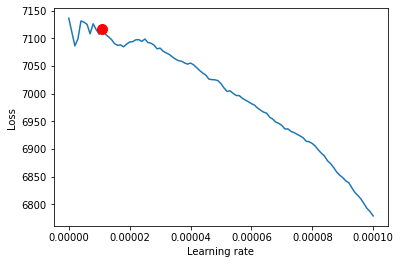

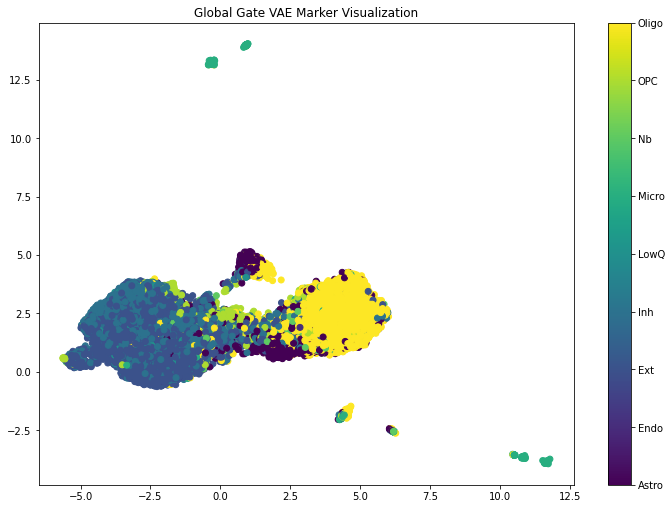

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



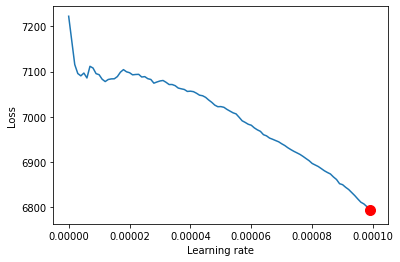

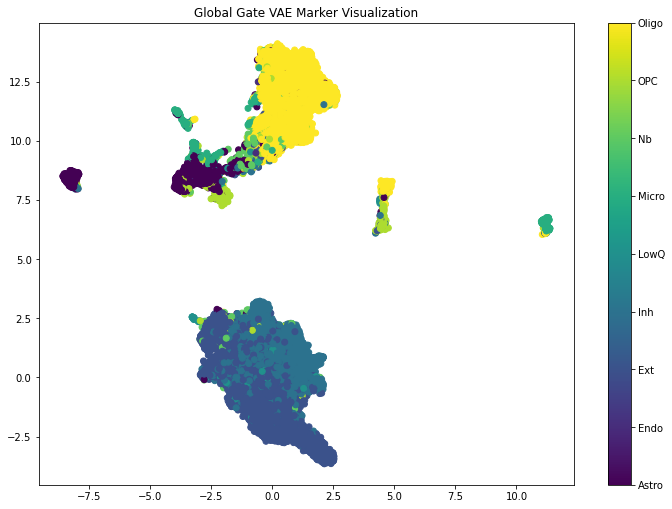

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 9.60004e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



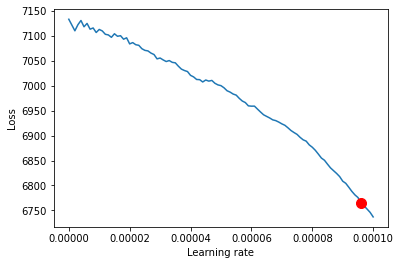

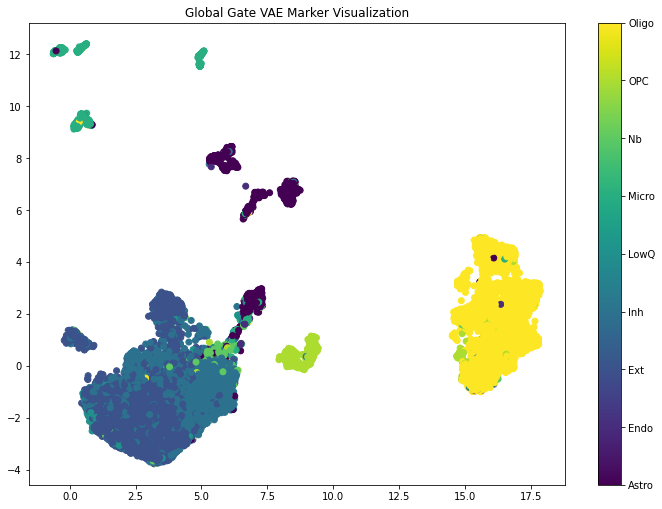

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 1.10089e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



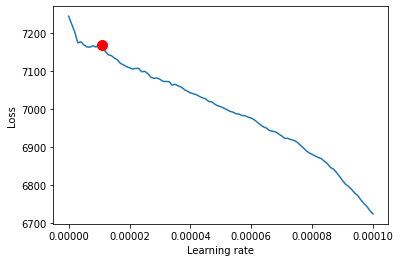

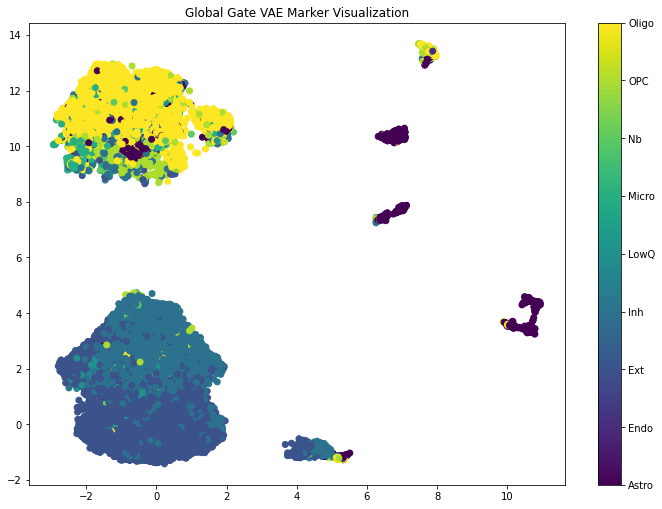

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 2.8 M 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
7.4 M     Trainable params
0         Non-trainable params
7.4 M     Total params
29.687    Total estimated model params size (MB)


New Learning Rate 9.000100000000001e-05


Exception in thread Thread-11:
Traceback (most recent call last):
  File "/usr/lib/python3.7/threading.py", line 926, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.7/dist-packages/tqdm/_monitor.py", line 78, in run
    instances = self.get_instances()
  File "/usr/local/lib/python3.7/dist-packages/tqdm/_monitor.py", line 58, in get_instances
    return [i for i in self.tqdm_cls._instances.copy()
  File "/usr/lib/python3.7/_weakrefset.py", line 92, in copy
    return self.__class__(self)
  File "/usr/lib/python3.7/_weakrefset.py", line 50, in __init__
    self.update(data)
  File "/usr/lib/python3.7/_weakrefset.py", line 119, in update
    for element in other:
  File "/usr/lib/python3.7/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



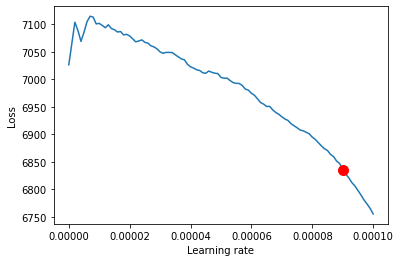

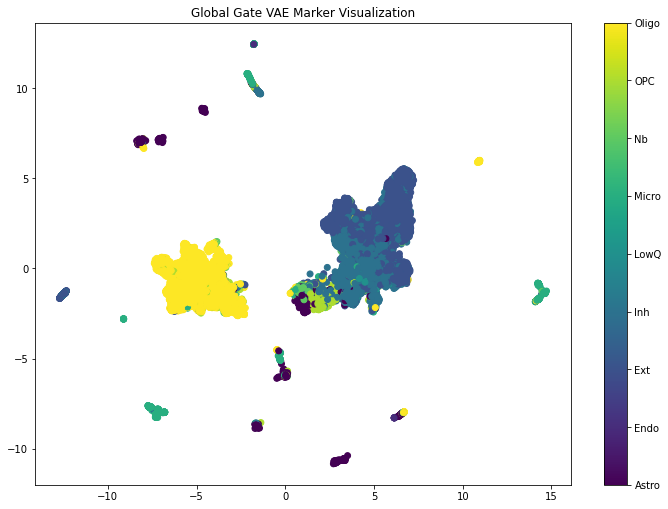

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers=num_cores)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_GlobalGate(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, batch_norm = batch_norm, temperature_decay=0.95)
    tmp_path = model_save_path + 'globalgate_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus = gpus, tpu_cores = tpu_cores, 
                     min_epochs = 50, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience =  10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    globalgate_markers = model.markers().clone().cpu().detach().numpy()
    
 
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = globalgate_markers)
    np.save(model_save_path + 'globalgate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'globalgate_vae_markers_{}.npy'.format(tryy), globalgate_markers)
    np.save(model_save_path + 'experiment_data_folds/globalgate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Global Gate VAE Marker Visualization', path = viz_save_path + 'globalgate_vae_markers_{}.png'.format(tryy), markers = globalgate_markers)

In [ ]:
model.t

tensor(0.1612)

In [ ]:
results

(0.06100795755968169,
 {'0': {'f1-score': 0.9739837398373984,
   'precision': 0.9708265802269044,
   'recall': 0.9771615008156607,
   'support': 613},
  '1': {'f1-score': 0.6666666666666666,
   'precision': 1.0,
   'recall': 0.5,
   'support': 2},
  '2': {'f1-score': 0.9353497164461246,
   'precision': 0.9321778447626224,
   'recall': 0.9385432473444613,
   'support': 2636},
  '3': {'f1-score': 0.8908145580589255,
   'precision': 0.8736543909348442,
   'recall': 0.9086623453152622,
   'support': 1697},
  '4': {'f1-score': 0.27906976744186046,
   'precision': 1.0,
   'recall': 0.16216216216216217,
   'support': 74},
  '5': {'f1-score': 0.9742489270386265,
   'precision': 0.978448275862069,
   'recall': 0.9700854700854701,
   'support': 234},
  '6': {'f1-score': 0.5909090909090909,
   'precision': 0.639344262295082,
   'recall': 0.5492957746478874,
   'support': 71},
  '7': {'f1-score': 0.8936170212765956,
   'precision': 0.967741935483871,
   'recall': 0.8300395256916996,
   'support': 

## Train Running State VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)



New Learning Rate 9.40006e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



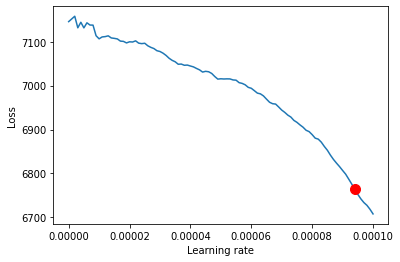

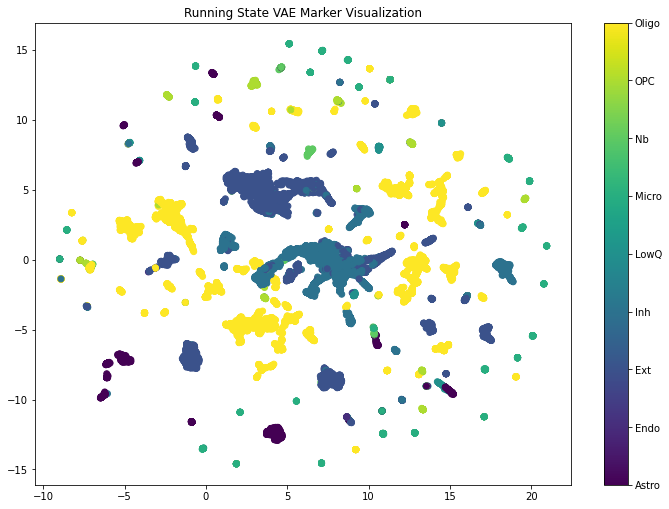

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)



New Learning Rate 9.80002e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



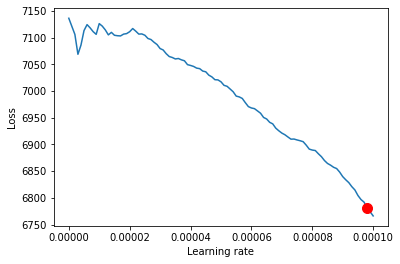

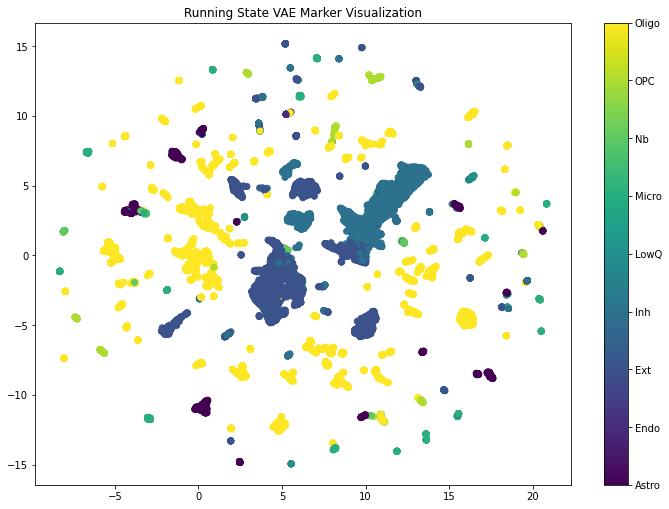

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)



New Learning Rate 9.40006e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



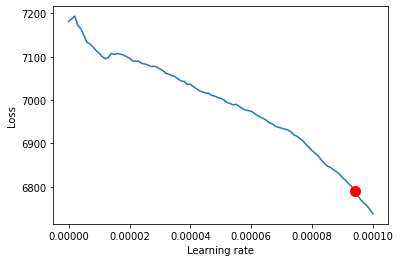

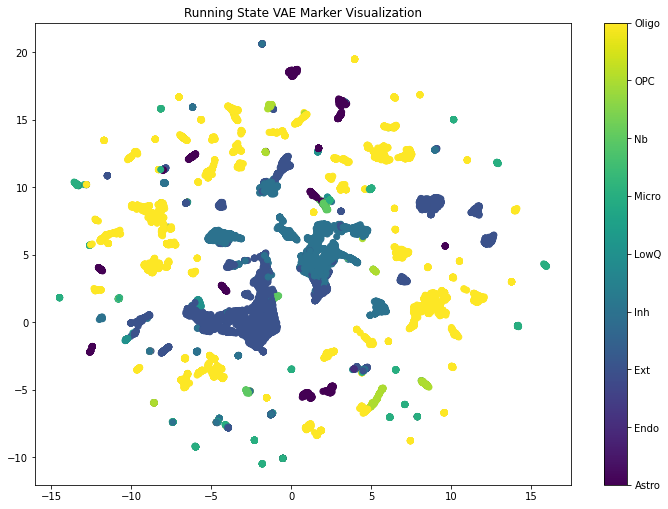

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)


New Learning Rate 9.30007e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



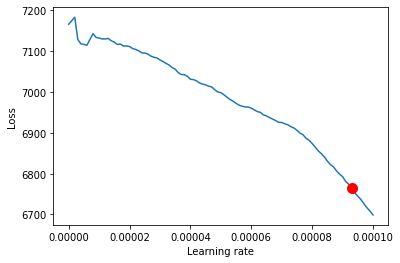

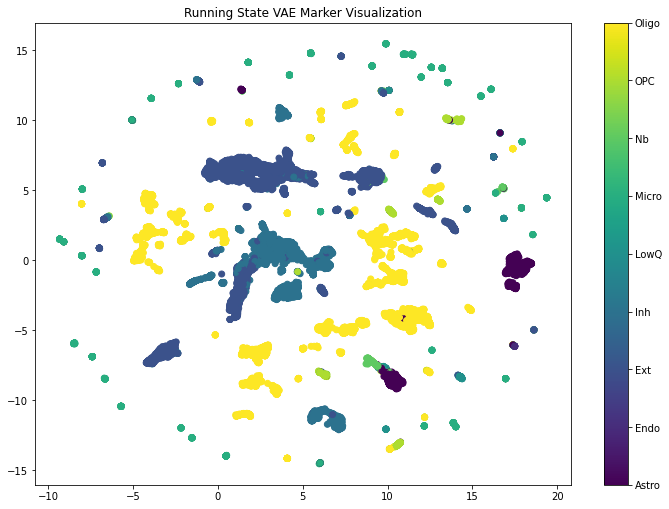

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 4.8 M 
----------------------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.023    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



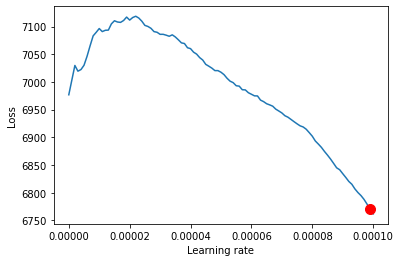

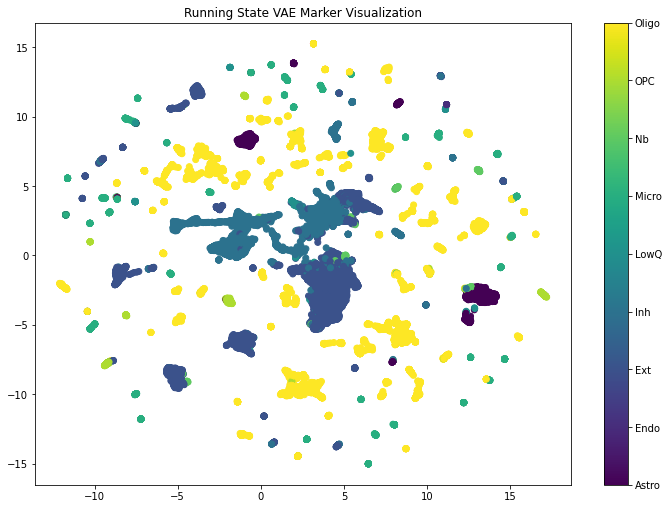

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_RunningState(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 50, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_vae_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State VAE Marker Visualization', path = viz_save_path + 'runningstate_vae_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
results

(0.01225211570039153,
 {'0': {'f1-score': 0.9956101843722563,
   'precision': 0.9929947460595446,
   'recall': 0.9982394366197183,
   'support': 568},
  '1': {'f1-score': 0.9090909090909091,
   'precision': 1.0,
   'recall': 0.8333333333333334,
   'support': 6},
  '2': {'f1-score': 0.9863584691170898,
   'precision': 0.9871065604854001,
   'recall': 0.9856115107913669,
   'support': 2641},
  '3': {'f1-score': 0.9797475785148224,
   'precision': 0.974314068884997,
   'recall': 0.9852420306965761,
   'support': 1694},
  '4': {'f1-score': 0.9104477611940298,
   'precision': 0.9838709677419355,
   'recall': 0.8472222222222222,
   'support': 72},
  '5': {'f1-score': 0.9876543209876544,
   'precision': 0.9836065573770492,
   'recall': 0.9917355371900827,
   'support': 242},
  '6': {'f1-score': 0.9162011173184357,
   'precision': 0.9647058823529412,
   'recall': 0.8723404255319149,
   'support': 94},
  '7': {'f1-score': 0.9864406779661017,
   'precision': 0.9864406779661017,
   'recall': 0.98

## Running State Classifier

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The 

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)


New Learning Rate 7.40026e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



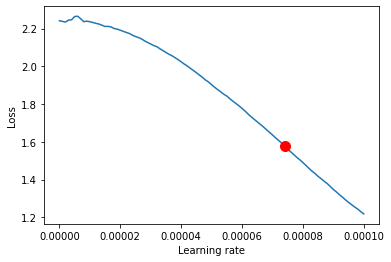

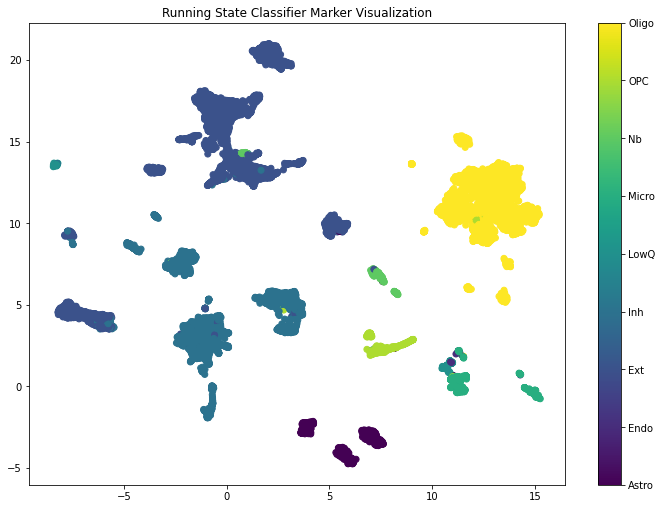

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The 

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)


New Learning Rate 7.0003e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



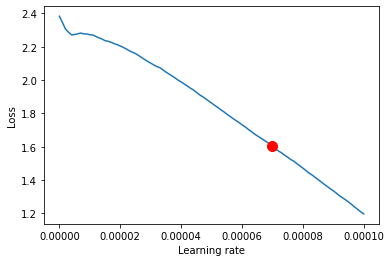

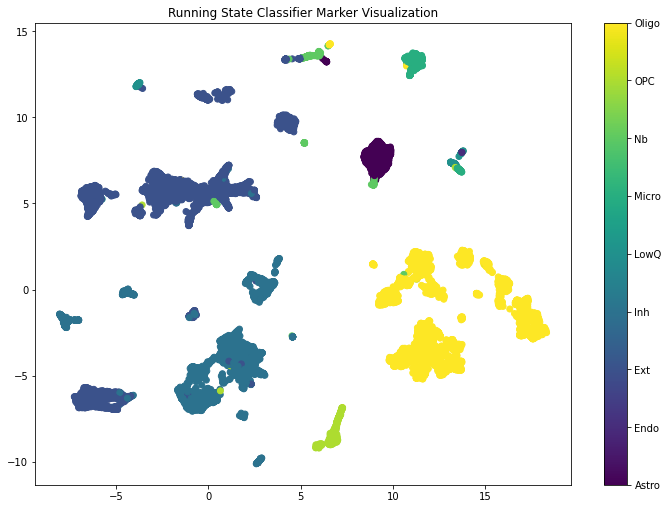

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The 

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)


New Learning Rate 9.20008e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



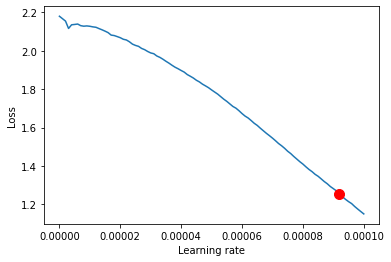

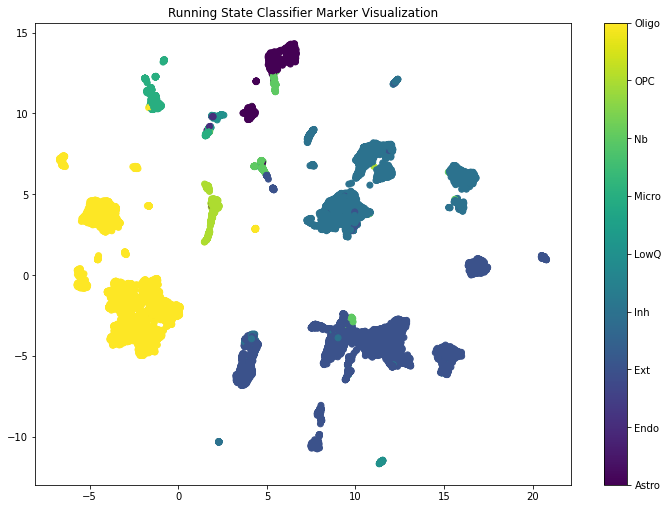

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The 

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)


New Learning Rate 6.500350000000001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



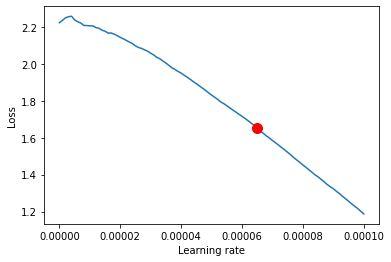

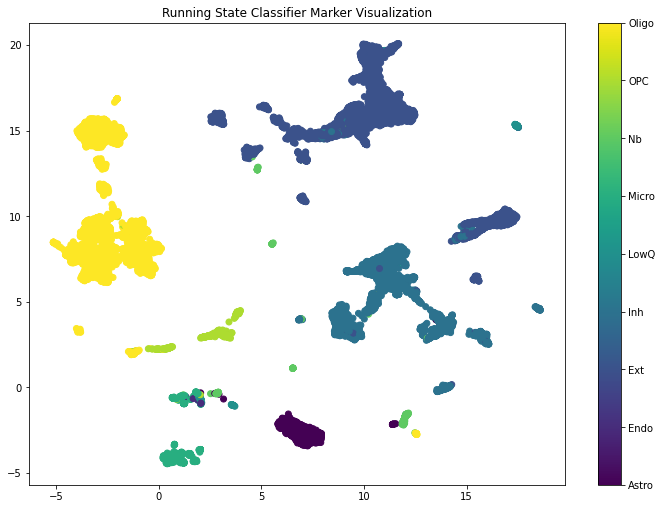

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The 

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 4.8 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.7 M     Trainable params
0         Non-trainable params
7.7 M     Total params
30.614    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



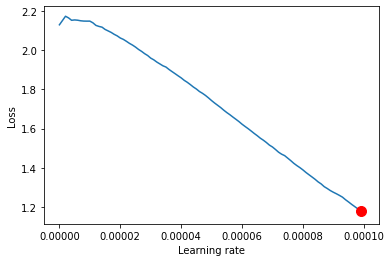

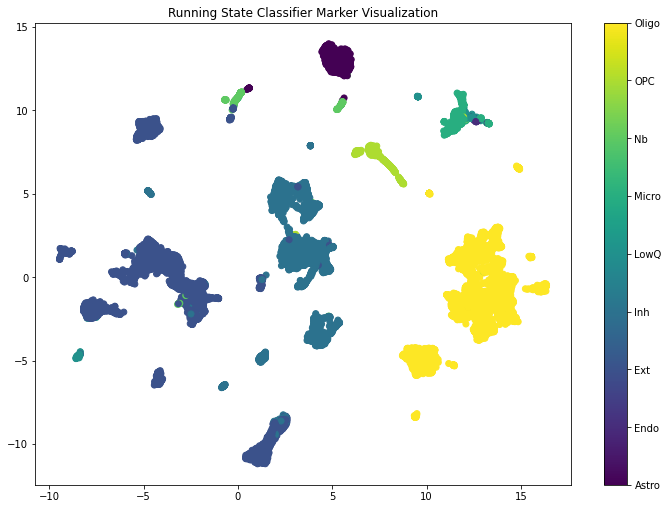

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = GumbelClassifier(input_size, hidden_layer_size, z_size, num_classes = len(encoder.classes_), 
                             k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_classifier_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 50, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_classifier_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_classifier_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State Classifier Marker Visualization', path = viz_save_path + 'runningstate_classifier_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
results

(0.005178729316660302,
 {'0': {'f1-score': 0.9975227085053675,
   'precision': 0.9983471074380166,
   'recall': 0.9966996699669967,
   'support': 606},
  '1': {'f1-score': 0.5,
   'precision': 1.0,
   'recall': 0.3333333333333333,
   'support': 3},
  '2': {'f1-score': 0.9958265287606605,
   'precision': 0.9945632475534614,
   'recall': 0.997093023255814,
   'support': 2752},
  '3': {'f1-score': 0.9933494558645708,
   'precision': 0.9939503932244405,
   'recall': 0.992749244712991,
   'support': 1655},
  '4': {'f1-score': 0.8976377952755905,
   'precision': 0.95,
   'recall': 0.8507462686567164,
   'support': 67},
  '5': {'f1-score': 0.9826086956521739,
   'precision': 0.9699570815450643,
   'recall': 0.9955947136563876,
   'support': 227},
  '6': {'f1-score': 0.9801324503311257,
   'precision': 1.0,
   'recall': 0.961038961038961,
   'support': 77},
  '7': {'f1-score': 0.9943925233644859,
   'precision': 0.9925373134328358,
   'recall': 0.9962546816479401,
   'support': 267},
  '8': {'

## Concrete VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarni

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 9.50005e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



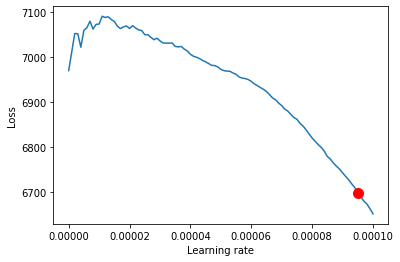

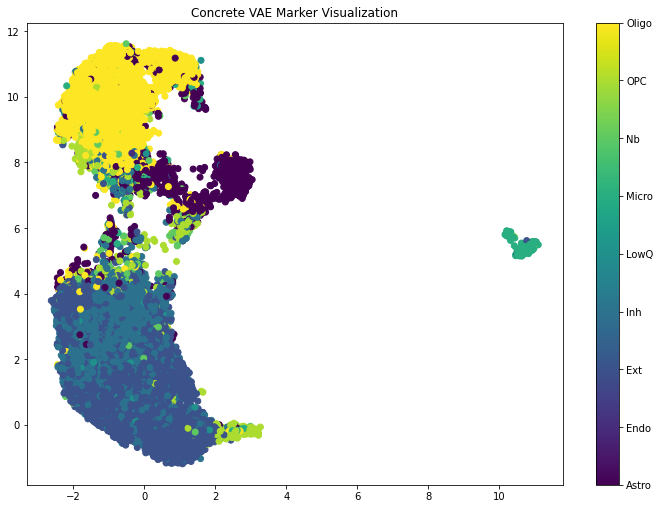

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarni

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)



New Learning Rate 1.2008800000000001e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



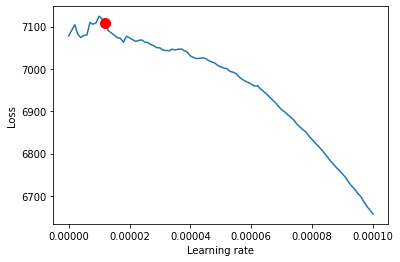

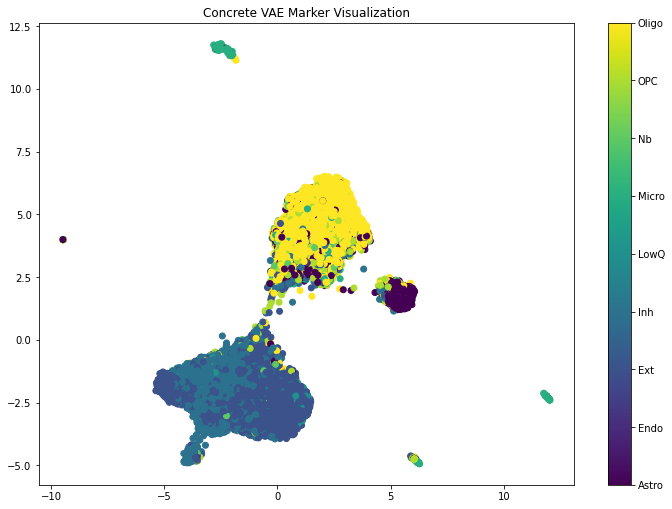

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarni

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 1.50085e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



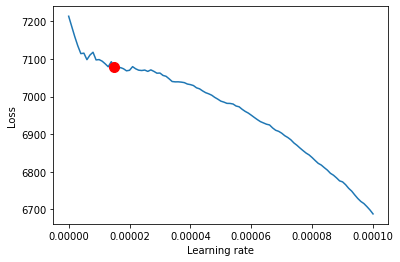

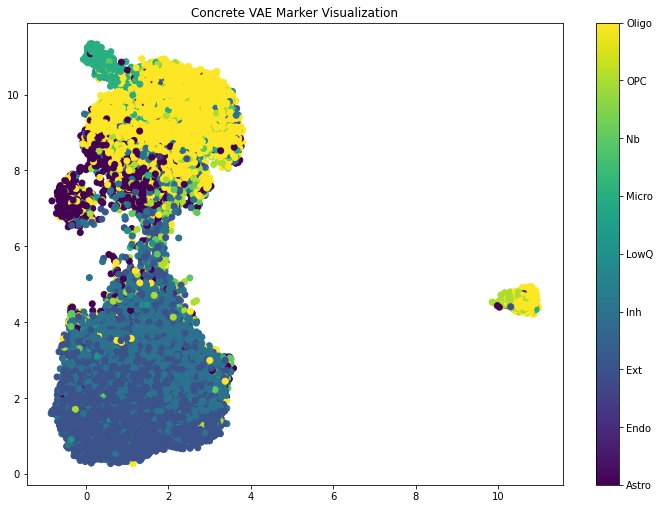

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarni

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 9.50005e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



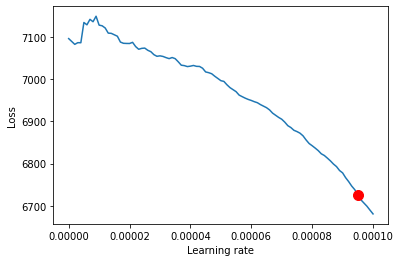

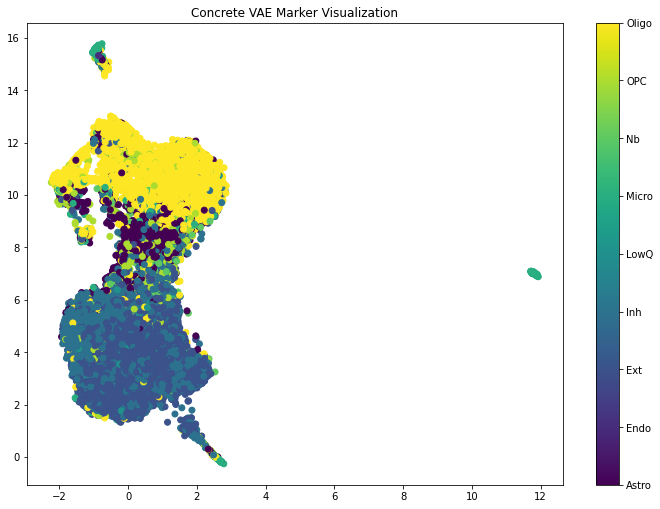

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:69: UserWarni

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (50) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



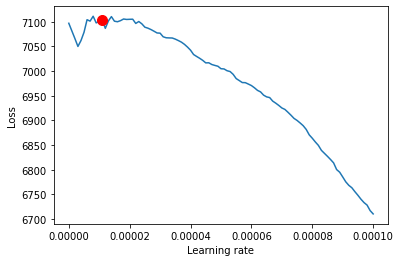

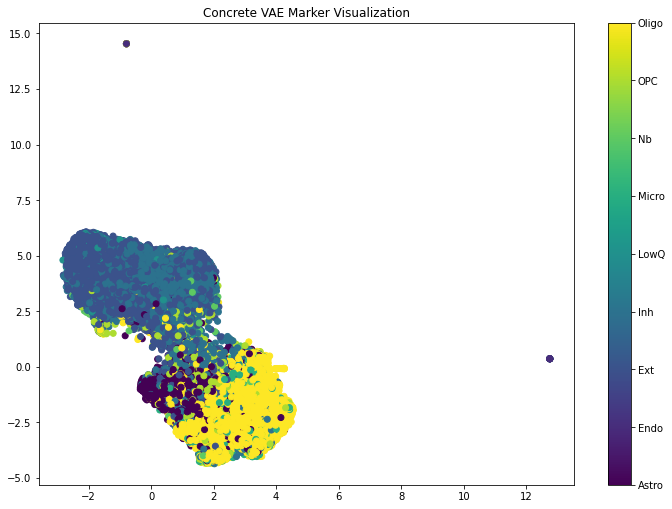

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = ConcreteVAE_NMSL(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'concrete_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 50, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    concrete_vae_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = concrete_vae_markers)
    np.save(model_save_path + 'concrete_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'concrete_vae_markers_{}.npy'.format(tryy), concrete_vae_markers)
    np.save(model_save_path + 'experiment_data_folds/concrete_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Concrete VAE Marker Visualization', path = viz_save_path + 'concrete_vae_markers_{}.png'.format(tryy), markers = concrete_vae_markers)

In [ ]:
results = np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)

In [ ]:
results

array([0.11810029051408366,
       {'0': {'precision': 0.9109062980030722, 'recall': 0.9457735247208932, 'f1-score': 0.9280125195618153, 'support': 627}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 3}, '2': {'precision': 0.8556149732620321, 'recall': 0.8982035928143712, 'f1-score': 0.8763921855030125, 'support': 2672}, '3': {'precision': 0.7823343848580442, 'recall': 0.7735495945102931, 'f1-score': 0.7779171894604767, 'support': 1603}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 64}, '5': {'precision': 0.888030888030888, 'recall': 0.9236947791164659, 'f1-score': 0.9055118110236221, 'support': 249}, '6': {'precision': 1.0, 'recall': 0.06382978723404255, 'f1-score': 0.12, 'support': 94}, '7': {'precision': 0.9009433962264151, 'recall': 0.7318007662835249, 'f1-score': 0.8076109936575052, 'support': 261}, '8': {'precision': 0.9679032930387661, 'recall': 0.9906143344709898, 'f1-score': 0.9791271347248578, 'support': 2344}, 'accuracy': 0.88189970

### Get Model Metrics from KNNs Classifiers

In [26]:
from sklearn.neighbors import KNeighborsClassifier

In [27]:
def generate_metrics_from_saved_files(X, y, folds_path, markers_path, classifier_model, save_path):
    train_indices, val_indices, test_indices = np.load(folds_path, allow_pickle = True)
    markers = np.load(markers_path, allow_pickle = True)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices, :]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = markers, model = classifier_model)

    np.save(save_path, results)
    return

def batch_generate_metrics_from_saved_files(X, y, format_folds_path, format_markers_path, format_save_path):
    for tryy in range(1, num_times+1):
        classifier_model = KNeighborsClassifier()
        generate_metrics_from_saved_files(X, y, format_folds_path.format(tryy), format_markers_path.format(tryy), classifier_model, format_save_path.format(tryy))
    return

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/l1_vae_indices_{}.npy',
                                  model_save_path+'l1_vae_markers_{}.npy',
                                  model_save_path+'l1_vae_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_rf_indices_{}.npy',
                                  model_save_path+'smash_rf_markers_{}.npy',
                                  model_save_path+'smash_rf_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_indices_{}.npy',
                                  model_save_path+'smash_markers_{}.npy',
                                  model_save_path+'smash_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/rankcorr_indices_{}.npy',
                                  model_save_path+'rankcorr_markers_{}.npy',
                                  model_save_path+'rankcorr_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/globalgate_vae_indices_{}.npy',
                                  model_save_path+'globalgate_vae_markers_{}.npy',
                                  model_save_path+'globalgate_vae_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_vae_indices_{}.npy',
                                  model_save_path+'runningstate_vae_markers_{}.npy',
                                  model_save_path+'runningstate_vae_knn_results_{}.npy')


batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_classifier_indices_{}.npy',
                                  model_save_path+'runningstate_classifier_markers_{}.npy',
                                  model_save_path+'runningstate_classifier_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/concrete_vae_indices_{}.npy',
                                  model_save_path+'concrete_vae_markers_{}.npy',
                                  model_save_path+'concrete_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

# Results and Visualizations

## Accuracies and F1

In [ ]:
result_axis = [
 ('L1 VAE', 'l1_vae_results_{}.npy', 'l1_vae_knn_results_{}.npy'),
 ('Smash RF', 'smash_rf_results_{}.npy', 'smash_rf_knn_results_{}.npy'),
 ('SMaSH DNN', 'smash_results_{}.npy', 'smash_knn_results_{}.npy'),
 ('RankCorr', 'rankcorr_results_{}.npy', 'rankcorr_knn_results_{}.npy'),
 ('Global Gate VAE', 'globalgate_vae_results_{}.npy', 'globalgate_vae_knn_results_{}.npy'),
 ('RunningGumbel VAE', 'runningstate_vae_results_{}.npy', 'runningstate_vae_knn_results_{}.npy'),
 ('RunningGumbel Classifier', 'runningstate_classifier_results_{}.npy', 'runningstate_classifier_knn_results_{}.npy'),
 ('Concrete VAE',  'concrete_vae_results_{}.npy', 'concrete_vae_knn_results_{}.npy')
]

In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[1], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[2], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

## Confusion Matrices

k = 50

In [ ]:
# https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          save_path = None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


k = 50

### Smash RF

In [ ]:
results =  np.load(model_save_path + 'smash_rf_results_{}.npy'.format(1), allow_pickle = True)

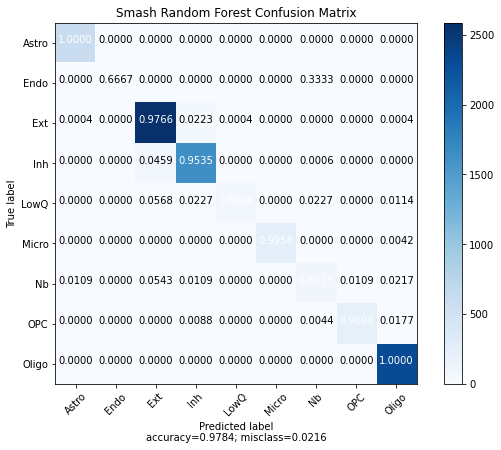

In [ ]:
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash Random Forest Confusion Matrix', save_path = viz_save_path + 'smash_rf_cm.png')

### RankCorr

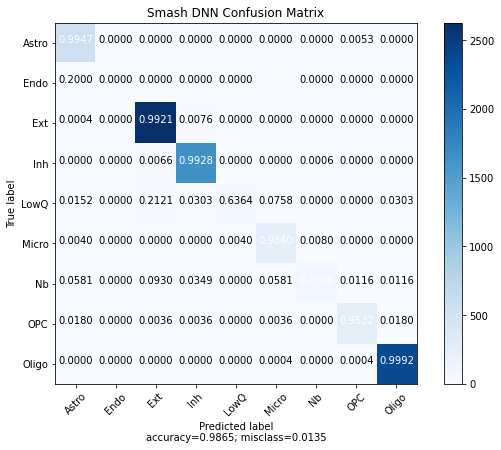

In [ ]:
results =  np.load(model_save_path + 'smash_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash DNN Confusion Matrix', save_path = viz_save_path + 'smash_dnn_cm.png')

### L1 VAE

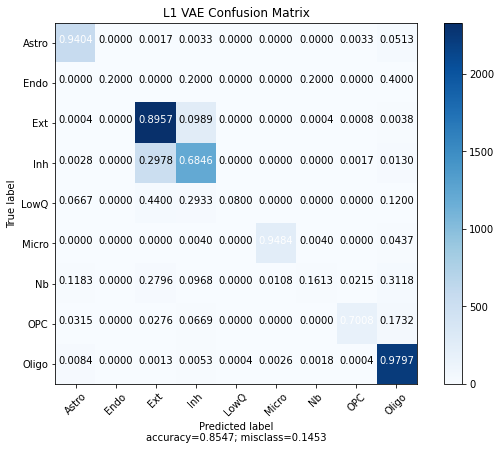

In [ ]:
results =  np.load(model_save_path + 'l1_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'L1 VAE Confusion Matrix', save_path = viz_save_path + 'l1_vae_cm.png')

### Global Gate VAE

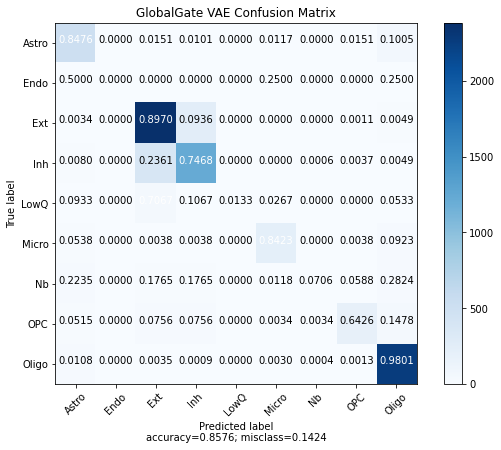

In [ ]:
results =  np.load(model_save_path + 'globalgate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'GlobalGate VAE Confusion Matrix', save_path = viz_save_path + 'globalgate_vae_cm.png')

### Running Gumbel VAE

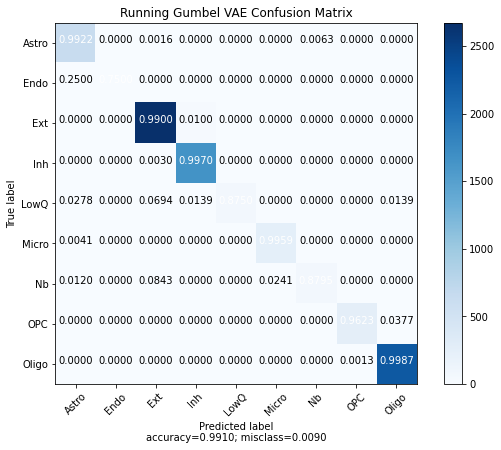

In [ ]:
results =  np.load(model_save_path + 'runningstate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel VAE Confusion Matrix', save_path = viz_save_path + 'runningstate_vae_cm.png')

### Running Gumbel Classifier


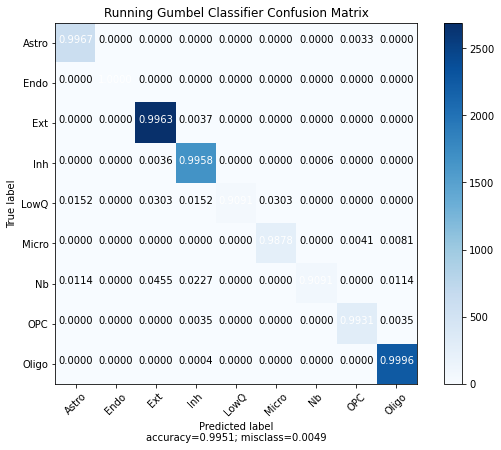

In [ ]:
results =  np.load(model_save_path + 'runningstate_classifier_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel Classifier Confusion Matrix', save_path = viz_save_path + 'runningstate_classifier_cm.png')

### Concrete VAE

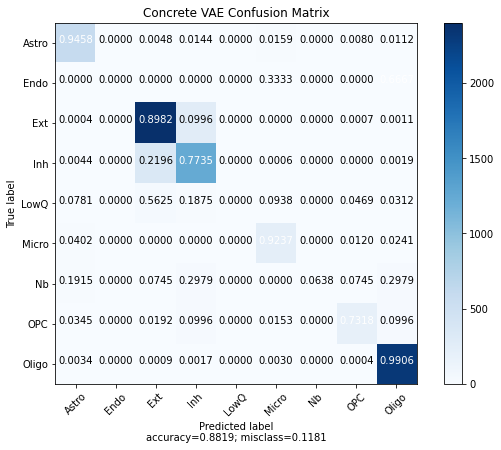

In [ ]:
results =  np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Concrete VAE Confusion Matrix', save_path = viz_save_path + 'concrete_vae_cm.png')

## UMap Visualization

In [ ]:
import cv2

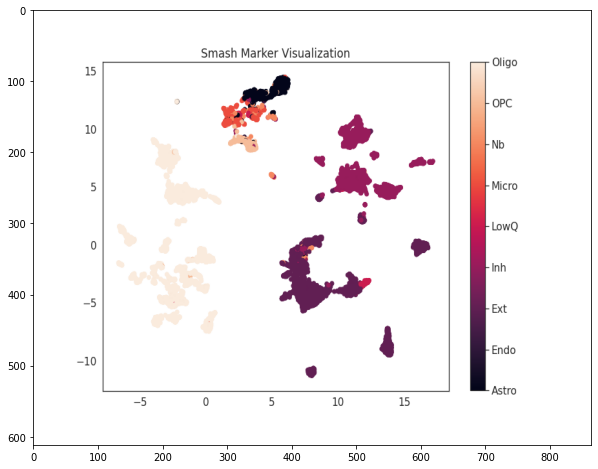

In [ ]:
img = cv2.imread(viz_save_path + 'smash_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

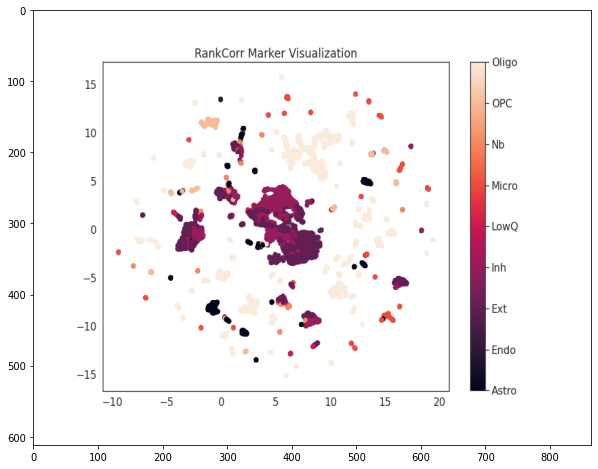

In [ ]:
img = cv2.imread(viz_save_path + 'rankcorr_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')

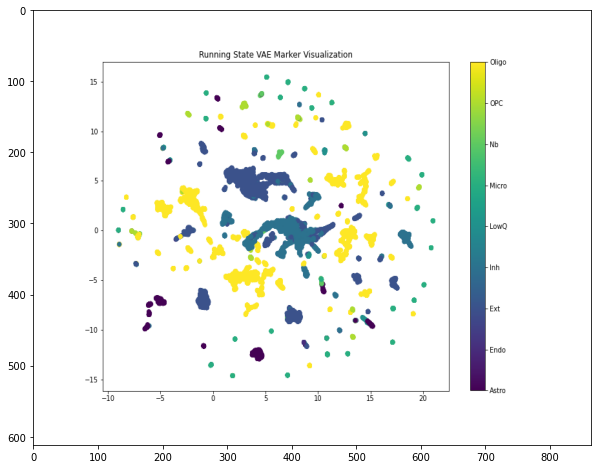

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

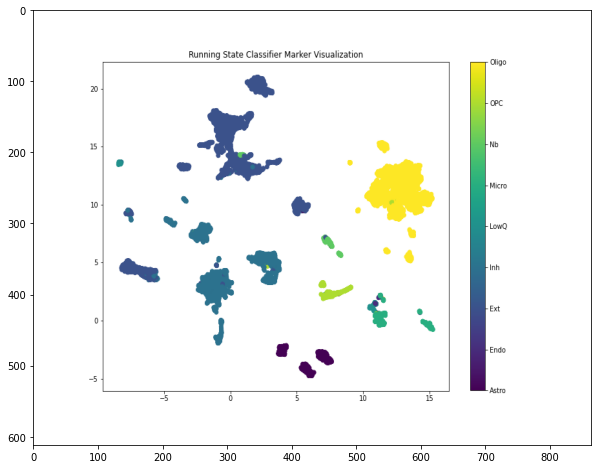

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_classifier_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

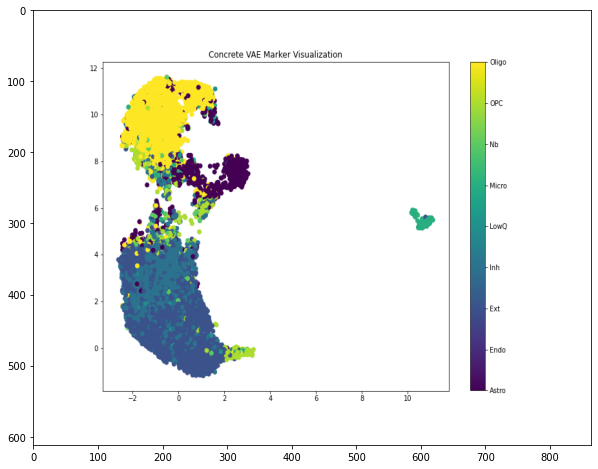

In [ ]:
img = cv2.imread(viz_save_path + 'concrete_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

## Visualizing Reconstructions

from first model of each

## L1 VAE

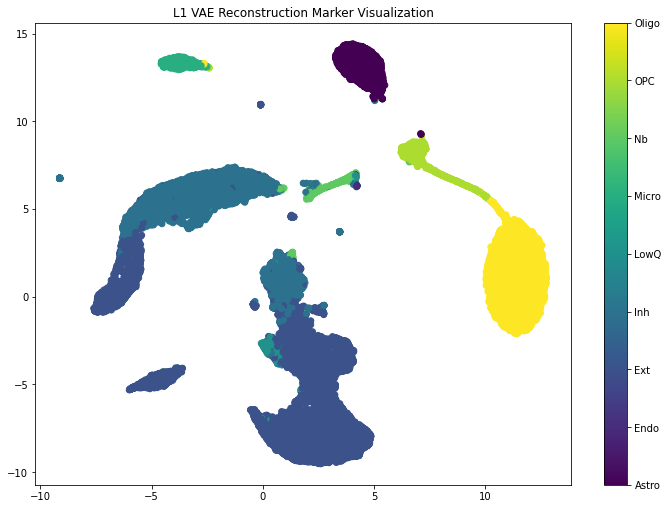

In [ ]:
model = load_model(VAE_l1_diag, model_save_path + 'l1_vae_{}.ckpt'.format(1))
l1_vae_markers = np.load(model_save_path + 'l1_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'L1 VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_l1_vae_{}.png'.format(1), markers = l1_vae_markers)

### Global Gate VAE

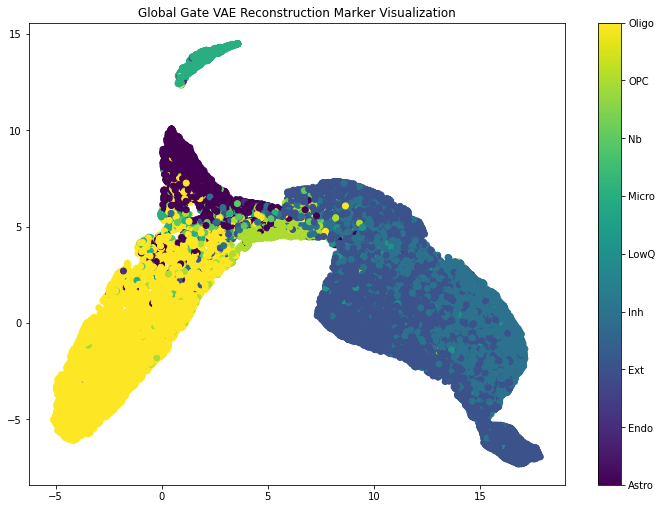

In [ ]:
model = load_model(VAE_Gumbel_GlobalGate, model_save_path + 'globalgate_vae_{}.ckpt'.format(1))
globalgate_vae_markers = np.load(model_save_path + 'globalgate_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Global Gate VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_globalgate_vae_{}.png'.format(1), markers = globalgate_vae_markers)

### Running State Gumbel VAE

In [ ]:
model = load_model(VAE_Gumbel_RunningState, model_save_path + 'runningstate_vae_{}.ckpt'.format(1))


In [ ]:
runningstate_vae_markers = np.load(model_save_path + 'runningstate_vae_markers_{}.npy'.format(1), allow_pickle=True)

In [ ]:
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]

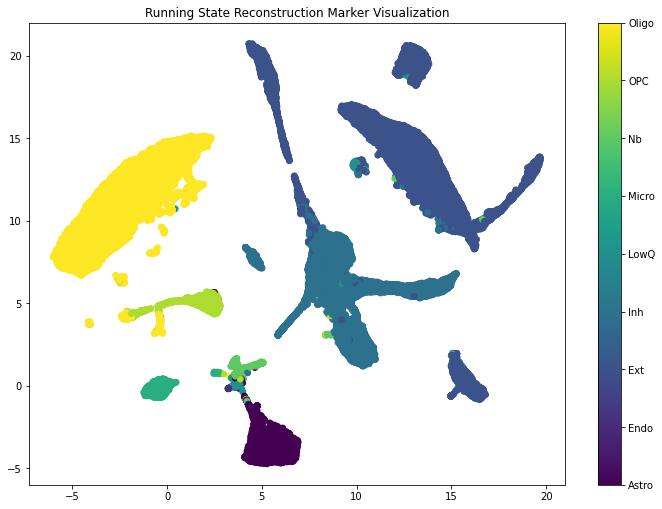

In [ ]:
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Running State Reconstruction Marker Visualization', path = viz_save_path + 'recon_runningstate_vae_{}.png'.format(1), markers = runningstate_vae_markers)

Concrete VAE

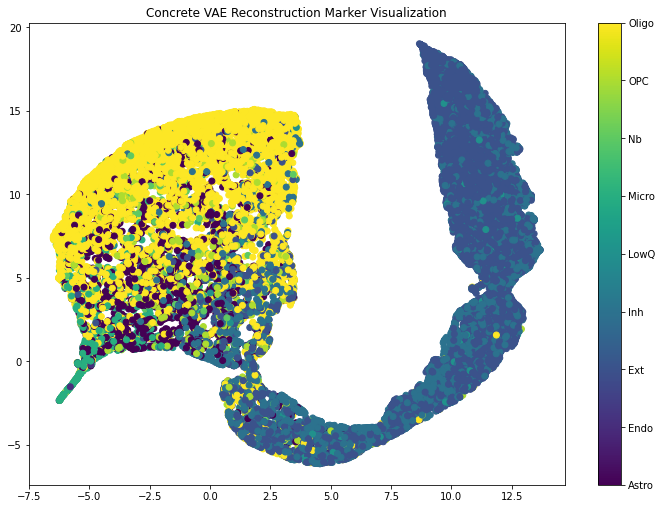

In [ ]:
model = load_model(ConcreteVAE_NMSL, model_save_path + 'concrete_vae_{}.ckpt'.format(1))
concrete_vae_markers = np.load(model_save_path + 'concrete_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Concrete VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_concrete_vae_{}.png'.format(1), markers = concrete_vae_markers)

The concretevae has one single trajectory.

# Things to note for paper

PySmash uses a seed internally so the model is deterministic to a particular dataset. We used various different train seeds, whereas the smash paper uses the whole dataset for the data.